In [1]:
import pandas as pd

import cv2

from pathlib import Path

import matplotlib.pyplot as plt

from src.features.get_absolute_path import get_absolute_path

from tensorflow.keras.models import load_model

from src.features import build_features
from src.models import train_model, predict_model

# 1 - Pré-traitement

In [2]:
# Regroupement des 4 fichiers excel en un fichier csv de metadonnées comportant les urls vers les images en local
df = build_features.create_metadata()

Le fichier  COVID-1 a été ajouté au tableau.
Le fichier  COVID-2 a été ajouté au tableau.
Le fichier  COVID-3 a été ajouté au tableau.
Le fichier  COVID-4 a été ajouté au tableau.
Le fichier  COVID-5 a été ajouté au tableau.
Le fichier  COVID-6 a été ajouté au tableau.
Le fichier  COVID-7 a été ajouté au tableau.
Le fichier  COVID-8 a été ajouté au tableau.
Le fichier  COVID-9 a été ajouté au tableau.
Le fichier  COVID-10 a été ajouté au tableau.
Le fichier  COVID-11 a été ajouté au tableau.
Le fichier  COVID-12 a été ajouté au tableau.
Le fichier  COVID-13 a été ajouté au tableau.
Le fichier  COVID-14 a été ajouté au tableau.
Le fichier  COVID-15 a été ajouté au tableau.
Le fichier  COVID-16 a été ajouté au tableau.
Le fichier  COVID-17 a été ajouté au tableau.
Le fichier  COVID-18 a été ajouté au tableau.
Le fichier  COVID-19 a été ajouté au tableau.
Le fichier  COVID-20 a été ajouté au tableau.
Le fichier  COVID-21 a été ajouté au tableau.
Le fichier  COVID-22 a été ajouté au tablea

In [19]:
df = pd.read_csv(get_absolute_path(r"data\processed\metadatas.csv"))
# Supprimer les espace dans les noms de fichier et mettre à jour les métadonnées
df=build_features.rename_files(df)

COVID-1.png renamed to COVID-1.png
COVID-10.png renamed to COVID-10.png
COVID-100.png renamed to COVID-100.png
COVID-1000.png renamed to COVID-1000.png
COVID-1001.png renamed to COVID-1001.png
COVID-1002.png renamed to COVID-1002.png
COVID-1003.png renamed to COVID-1003.png
COVID-1004.png renamed to COVID-1004.png
COVID-1005.png renamed to COVID-1005.png
COVID-1006.png renamed to COVID-1006.png
COVID-1007.png renamed to COVID-1007.png
COVID-1008.png renamed to COVID-1008.png
COVID-1009.png renamed to COVID-1009.png
COVID-101.png renamed to COVID-101.png
COVID-1010.png renamed to COVID-1010.png
COVID-1011.png renamed to COVID-1011.png
COVID-1012.png renamed to COVID-1012.png
COVID-1013.png renamed to COVID-1013.png
COVID-1014.png renamed to COVID-1014.png
COVID-1015.png renamed to COVID-1015.png
COVID-1016.png renamed to COVID-1016.png
COVID-1017.png renamed to COVID-1017.png
COVID-1018.png renamed to COVID-1018.png
COVID-1019.png renamed to COVID-1019.png
COVID-102.png renamed to COVID

In [ ]:
# Masquage des images et enregistrement de celles-ci en local dans data/processed
df = pd.read_csv(get_absolute_path(r"data\processed\metadatas.csv"))
df = build_features.mask_images(df)


C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\masks\COVID-1.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\images\COVID-1.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\masks\COVID-2.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\images\COVID-2.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\masks\COVID-3.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\images\COVID-3.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\masks\COVID-4.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\images\COVID-4.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID\masks\COVID-5.png read
C:\Users\Cartiboi\Documents\GitHub\NOV24-BDS---Covid19-groupe-1\data\raw\COVID

In [17]:
import os

# Rename images
path = '../../data/raw/Lung_Opacity/images'
filenames = os.listdir(path)
for filename in filenames:
    new_filename = filename.replace('_', ' ')
    os.rename(os.path.join(path, filename), os.path.join(path, new_filename))
    print(filename, 'renamed to', new_filename)

# Rename masks
path = '../../data/raw/Lung_Opacity/masks'
filenames = os.listdir(path)
for filename in filenames:
    new_filename = filename.replace('_', ' ')
    os.rename(os.path.join(path, filename), os.path.join(path, new_filename))
    print(filename, 'renamed to', new_filename)

Lung_Opacity-1.png renamed to Lung Opacity-1.png
Lung_Opacity-10.png renamed to Lung Opacity-10.png
Lung_Opacity-100.png renamed to Lung Opacity-100.png
Lung_Opacity-1000.png renamed to Lung Opacity-1000.png
Lung_Opacity-1001.png renamed to Lung Opacity-1001.png
Lung_Opacity-1002.png renamed to Lung Opacity-1002.png
Lung_Opacity-1003.png renamed to Lung Opacity-1003.png
Lung_Opacity-1004.png renamed to Lung Opacity-1004.png
Lung_Opacity-1005.png renamed to Lung Opacity-1005.png
Lung_Opacity-1006.png renamed to Lung Opacity-1006.png
Lung_Opacity-1007.png renamed to Lung Opacity-1007.png
Lung_Opacity-1008.png renamed to Lung Opacity-1008.png
Lung_Opacity-1009.png renamed to Lung Opacity-1009.png
Lung_Opacity-101.png renamed to Lung Opacity-101.png
Lung_Opacity-1010.png renamed to Lung Opacity-1010.png
Lung_Opacity-1011.png renamed to Lung Opacity-1011.png
Lung_Opacity-1012.png renamed to Lung Opacity-1012.png
Lung_Opacity-1013.png renamed to Lung Opacity-1013.png
Lung_Opacity-1014.png re

In [4]:
# Création de dossiers train, val et test dans data/processed/train_test_split pour l'entraînement et le test du modèle
df = pd.read_csv(get_absolute_path(r"data\processed\metadatas_with_url.csv"))
build_features.create_train_test_folder(df)

NORMAL-7970.png
COVID-1372.png
NORMAL-354.png
Viral Pneumonia-569.png
NORMAL-4703.png
Lung_Opacity-1260.png
NORMAL-7799.png
NORMAL-4454.png
NORMAL-981.png
NORMAL-6179.png
NORMAL-5237.png
COVID-2728.png
NORMAL-6000.png
NORMAL-4541.png
NORMAL-1013.png
NORMAL-5918.png
NORMAL-4626.png
NORMAL-1520.png
Lung_Opacity-3743.png
NORMAL-4470.png
NORMAL-2389.png
NORMAL-166.png
NORMAL-2212.png
COVID-1839.png
NORMAL-4132.png
NORMAL-8035.png
Lung_Opacity-4670.png
Viral Pneumonia-1210.png
Lung_Opacity-4833.png
NORMAL-6289.png
NORMAL-7454.png
Lung_Opacity-4820.png
NORMAL-3943.png
COVID-3164.png
NORMAL-456.png
NORMAL-7634.png
NORMAL-9506.png
Lung_Opacity-4549.png
COVID-182.png
NORMAL-751.png
Lung_Opacity-5054.png
COVID-1875.png
NORMAL-3278.png
Viral Pneumonia-747.png
NORMAL-8289.png
COVID-2298.png
Lung_Opacity-800.png
COVID-709.png
NORMAL-8090.png
Viral Pneumonia-174.png
NORMAL-4788.png
COVID-2700.png
Lung_Opacity-2719.png
NORMAL-71.png
COVID-159.png
NORMAL-1003.png
Lung_Opacity-4566.png
Lung_Opacity-133

# 2 - Entraînement du modèle

In [3]:
train_folder = get_absolute_path(r"data\processed\train_test_split\train")
validation_folder = get_absolute_path(r"data\processed\train_test_split\validation")
test_folder = get_absolute_path(r"data\processed\train_test_split\test")

train_ds, val_ds, test_ds, class_names = train_model.open_datas(train_folder, validation_folder, test_folder)

Found 16932 files belonging to 4 classes.
Found 2116 files belonging to 4 classes.
Found 2117 files belonging to 4 classes.


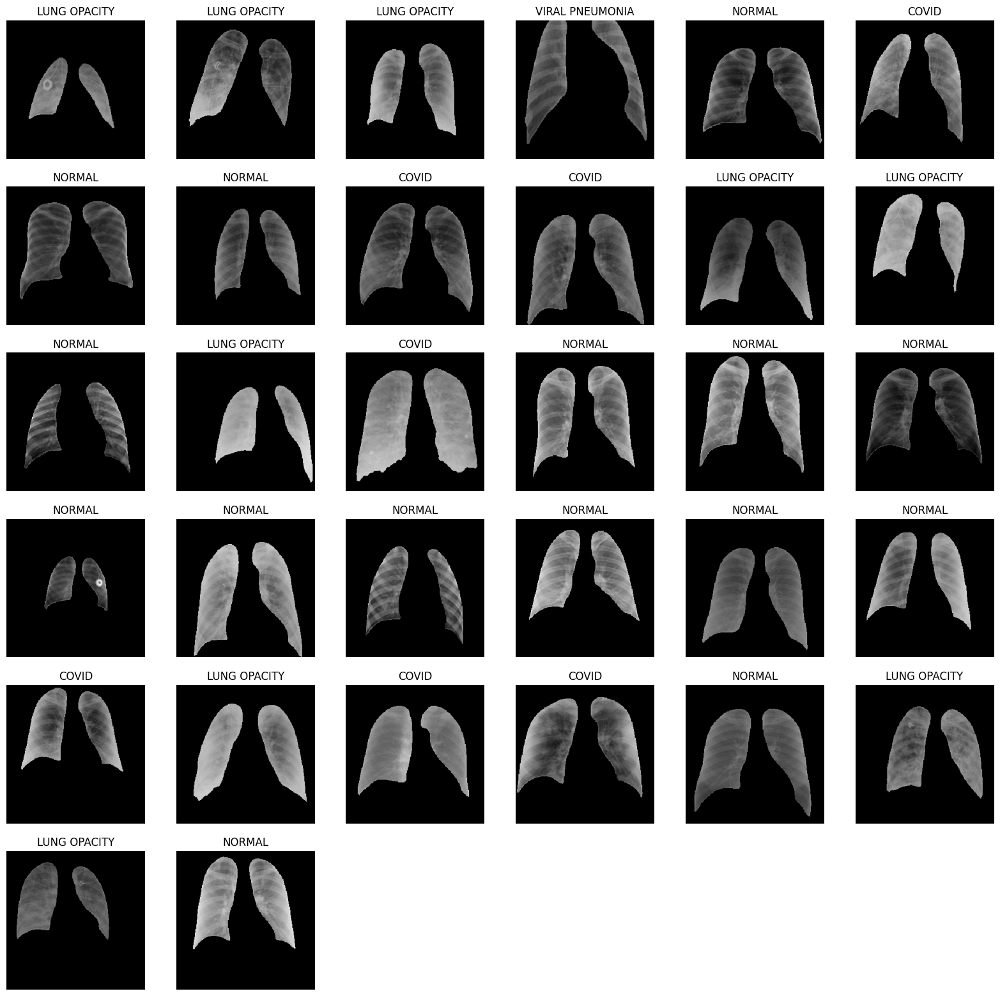

In [4]:
# Visualisation d'un échantillon des données

plt.figure(figsize=(20,40))

for images, labels in train_ds.take(1):  # Prendre un lot d'images et de labels
    for i, image in enumerate(images):
        plt.subplot(12,6,i+1)
        image = image / 255
        plt.imshow(image)
        label = labels[i].numpy()
        label_name = class_names[label]
        plt.title(label_name)
        plt.axis('off')

plt.show()

In [5]:
class_weights = train_model.calcul_weight_dict(ds=test_ds, class_names=class_names)

Poids des classes :
COVID: 1.4620165745856353
LUNG OPACITY: 0.8791528239202658
NORMAL: 0.5193817468105987
VIRAL PNEUMONIA: 3.949626865671642


## Partie entraînement -> décommenter pour entraîner le modèle

In [ ]:
#model, history = train_model.train_model(train_ds, val_ds, class_weights)

# 3 - Prediction du modèle

In [2]:
model = load_model(get_absolute_path(r"models\model_xception.keras"))
class_names = ['COVID', 'LUNG OPACITY', 'NORMAL', 'VIRAL PNEUMONIA']

## 3.1 - Essai du modèle sur les données de test

In [6]:
path = r"data\processed\train_test_split\test"
predictions = predict_model.predict_images(model, path, class_names, labeled_images=True)

COVID-1016.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step
COVID-1022.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
COVID-1039.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
COVID-104.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
COVID-1046.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
COVID-1070.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
COVID-1083.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
COVID-1093.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
COVID-1130.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
COVID-1131.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
COVID-1137.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
COVID-1148.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
COVID-1149.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
COVID-115.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
COVID-1151.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
COVID-1154.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
COVID-1157.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
COVID-1167.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
COVID-1168.png
1/1 ━━━━━━━━━━━━━━━━━━━

In [7]:
# Affichage de la matrice de confusion du modèle sur les données de test
display(pd.crosstab(predictions.iloc[:,1], predictions.iloc[:,2]))

PREDICTED_LABEL,COVID,LUNG OPACITY,NORMAL,VIRAL PNEUMONIA
TRUE_LABEL,,,,
COVID,292,24,45,1
LUNG OPACITY,50,498,50,4
NORMAL,16,73,922,8
VIRAL PNEUMONIA,1,0,1,132


## 3.2 - Prédiction sur un lot d'images

Cette partie concerne la prediction de multiples nouvelles images, qui sont stockées dans un dossier dont le chemin est à renseigner dans images_path

In [3]:
images_path = Path(input("Entrez l'url du dossier où les images sont stockées: "))
images_path = get_absolute_path(images_path)

# Prediction
predictions = predict_model.predict_images(model, images_path, class_names)

COVID-128.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step
COVID-217.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
COVID-392.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
COVID-76.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Lung_Opacity-128.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Lung_Opacity-195.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Lung_Opacity-245.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Lung_Opacity-250.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
NORMAL-12.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
NORMAL-154.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
NORMAL-155.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
NORMAL-72.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Viral Pneumonia-135.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Viral Pneumonia-225.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Viral Pneumonia-263.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Viral Pneumonia-99.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


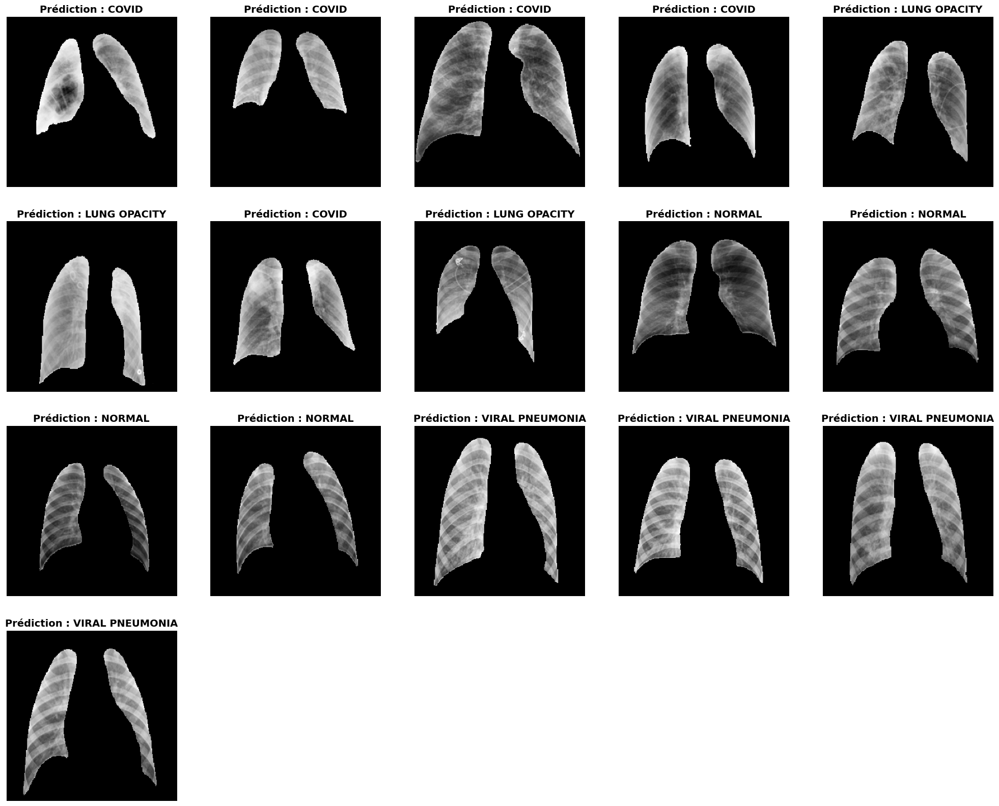

In [4]:
# Affichage des images et de leurs prédictions
predict_model.show_predictions(predictions=predictions,)

## 3.3 - Prédiction sur une image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


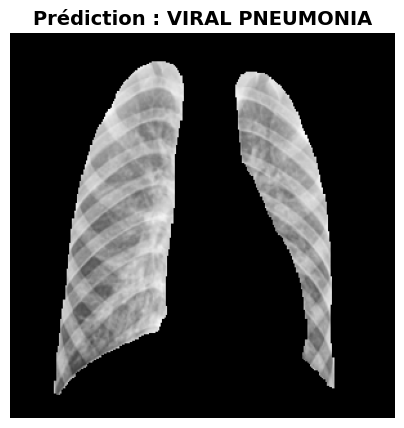

In [5]:
images_path = Path(input("Entrez l'url d'une image à classifier: "))
images_path = get_absolute_path(images_path)
prediction = predict_model.predict_one_image(model, class_names, images_path)
predict_model.show_predictions(prediction, one_image=True)